In [1]:
import pandas as pd
# import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import make_scorer, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
import lightgbm as lgb
import shap
import lime
import os
# from joblib import dump
import joblib
import warnings
import statsmodels.api as sm
import numpy as np

warnings.filterwarnings('ignore')
# import dask.dataframe as dd


IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


In [2]:
exps_dir = "../../exps"
if os.path.exists(exps_dir) == False: # tạo thư mục (nếu chưa có)
  os.makedirs(exps_dir, exist_ok=True)

save_dir = f"{exps_dir}/exp"
os.makedirs(save_dir, exist_ok=True)

In [3]:
plt.style.use('style.mplstyle')
shap.initjs()

In [4]:
ndays=1

X_train=pd.read_csv(f'{save_dir}/X_train_train_lag{ndays}_pre_processing.csv', index_col=None)
X_valid=pd.read_csv(f'{save_dir}/X_valid_train_lag{ndays}_pre_processing.csv', index_col=None)
y_train=pd.read_csv(f'{save_dir}/y_train_train_lag{ndays}_pre_processing.csv', index_col=None)
y_valid=pd.read_csv(f'{save_dir}/y_valid_train_lag{ndays}_pre_processing.csv', index_col=None)
scaler_y=joblib.load(f'{save_dir}/scaler_y.pkl')
best_params = dict(np.load(f'{save_dir}/best_params_.npz',allow_pickle=True))
target_valid=pd.read_csv(f'{save_dir}/target_valid{ndays}_pre_processing.csv', index_col=None)
target_valid.drop(columns=['Unnamed: 0'], inplace=True)


In [5]:

X_train.drop(columns=['Unnamed: 0'], inplace=True)
X_valid.drop(columns=['Unnamed: 0'], inplace=True)
y_train.drop(columns=['Unnamed: 0'], inplace=True)
y_valid.drop(columns=['Unnamed: 0'], inplace=True)
print(X_train.shape, y_train.shape, X_valid.shape, y_valid.shape)

(1086844, 102) (1086844, 1) (535312, 102) (535312, 1)


### Build LGBM and Improve in valid set

In [33]:

# lgbm_model = lgb.LGBMRegressor(objective='regression',**best_params['lgb_grid_search'].item())
# lgbm_model.fit(X_train, y_train)
# dump(lgbm_model, f'{save_dir}/lgbm_model_tuning.joblib')
lgbm_model=joblib.load(f'{save_dir}/lgbm_model_tuning.joblib')





In [34]:
lgbm_model_predictions = lgbm_model.predict(X_valid)
y_pred = scaler_y.inverse_transform(lgbm_model_predictions.reshape(-1, 1))
lgbm_model_mae = mean_absolute_error(target_valid, y_pred)
lgbm_model_r2 = r2_score(target_valid, y_pred)
print(f"LGBM model - Validation MAE: {lgbm_model_mae:.3f}, Validation R2: {lgbm_model_r2:.3f}")

LGBM model - Validation MAE: 71.112, Validation R2: 0.956


### Use LIME, SHAP to explained

100%|===================| 535035/535312 [22:01<00:00]        

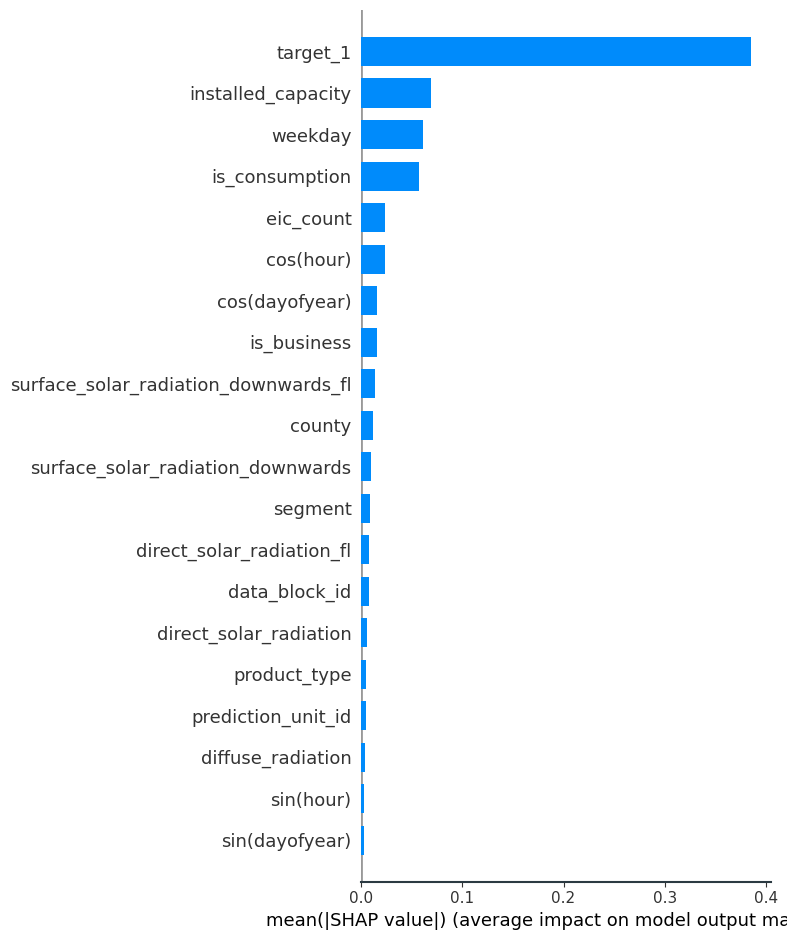

In [8]:
explainer_lgbm = shap.Explainer(lgbm_model, X_train)
shap_values_lgbm = explainer_lgbm(X_valid, check_additivity=False)


shap.summary_plot(shap_values_lgbm, X_valid, plot_type="bar", title="SHAP LGBM Feature Importance")


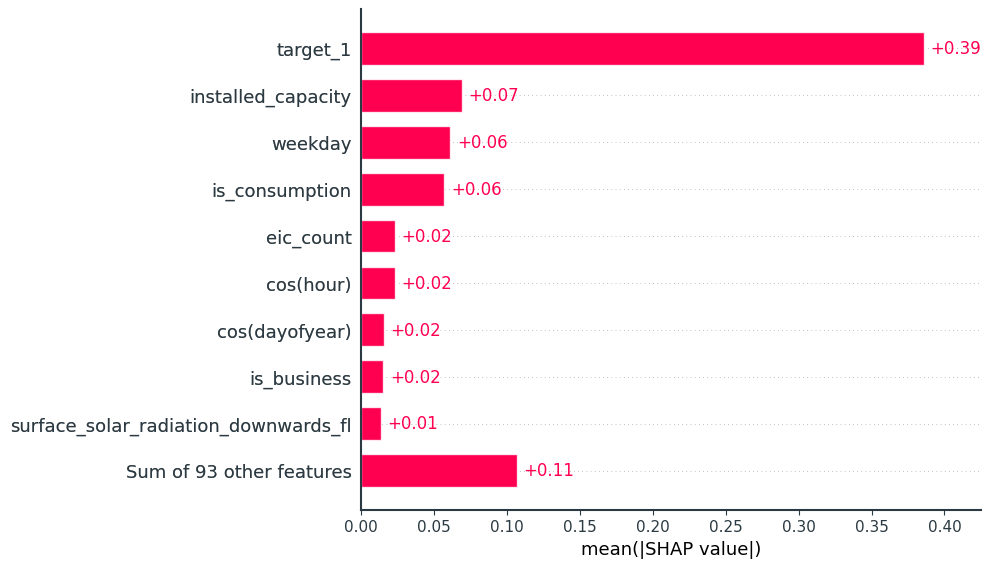

In [9]:
shap.plots.bar(shap_values_lgbm, show=False)
plt.show()
# plt.savefig("plots/bar.png")

In [35]:
i_med = np.argsort(lgbm_model_predictions)[len(lgbm_model_predictions)//2]
i_max = np.argmax(lgbm_model_predictions)
i_80 = np.argsort(lgbm_model_predictions)[int(len(lgbm_model_predictions)*0.8)]
i_60 = np.argsort(lgbm_model_predictions)[int(len(lgbm_model_predictions)*0.6)]
i_40 = np.argsort(lgbm_model_predictions)[int(len(lgbm_model_predictions)*0.4)]
i_20 = np.argsort(lgbm_model_predictions)[int(len(lgbm_model_predictions)*0.2)]
i_min = np.argmin(lgbm_model_predictions)


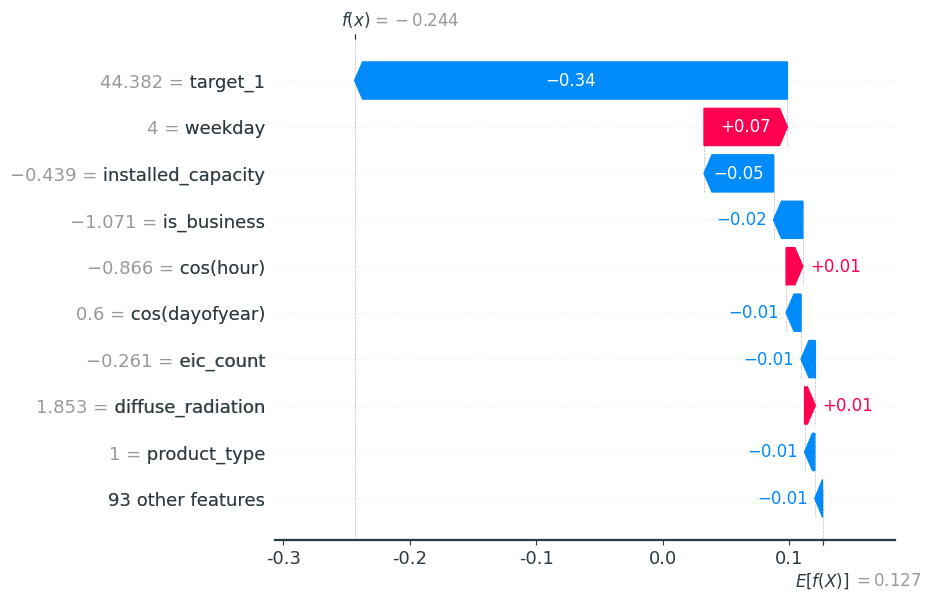

In [11]:
shap.plots.waterfall(shap_values_lgbm[i_med],show=True)
plt.show()
# plt.savefig("plots/waterfall_median.png")

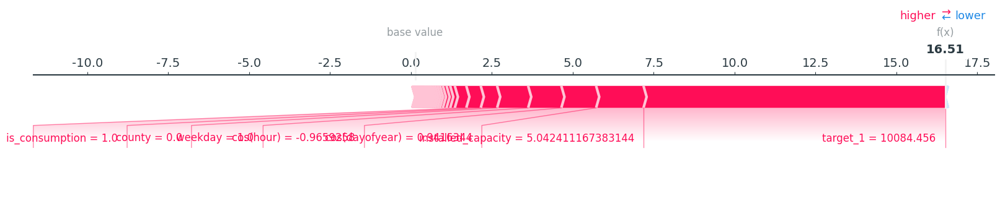

In [12]:
shap.plots.force(shap_values_lgbm[i_max], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_max.png")

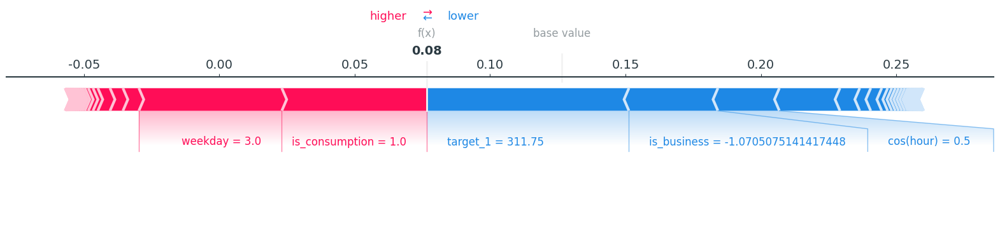

In [13]:
shap.plots.force(shap_values_lgbm[i_80], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_80.png")

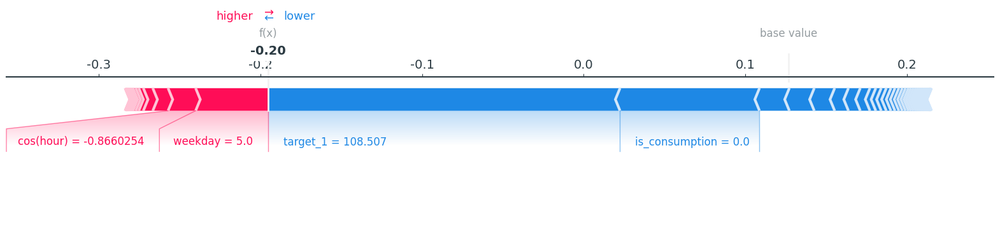

In [14]:
shap.plots.force(shap_values_lgbm[i_60], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_60.png")

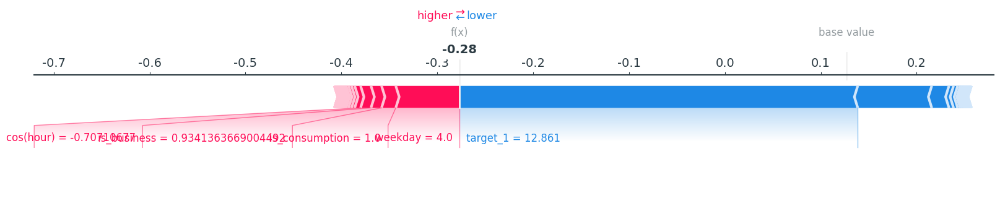

In [15]:
shap.plots.force(shap_values_lgbm[i_40], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_40.png")

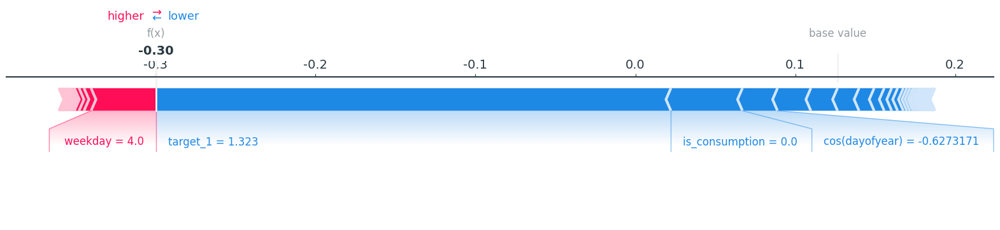

In [16]:
shap.plots.force(shap_values_lgbm[i_20], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_20.png")

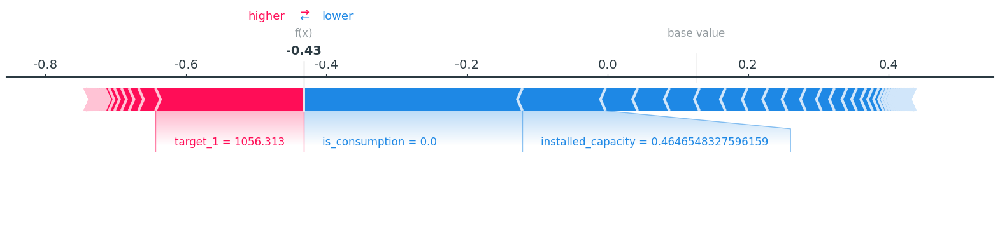

In [17]:
shap.plots.force(shap_values_lgbm[i_min], show=False, matplotlib=True)
plt.show()
# plt.savefig("plots/force_min.png")

In [36]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    mode='regression',  # Hoặc 'classification' nếu bạn làm việc với bài toán phân loại
    feature_names=X_train.columns,
    class_names=['target'],
    verbose=True,
    discretize_continuous=True
)


In [37]:
j = i_min
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept -0.22417165026922622
Prediction_local [0.44686338]
Right: -0.4325905144970278


In [38]:
exp.show_in_notebook(show_table=True)


In [39]:
exp.as_list()


[('target_1 > 168.17', 1.308776748207543),
 ('year > 2022.00', -0.8794538950375751),
 ('installed_capacity > 0.07', 0.1760180815302367),
 ('is_consumption <= 0.00', -0.15926048628997314),
 ('cos(hour) <= -0.71', 0.04547045154862204),
 ('eic_count > -0.01', 0.03950886244847972),
 ('10_metre_v_wind_component_fl <= -0.66', 0.03716677308390175),
 ('-0.89 < temperature <= 0.03', 0.03535092808490022),
 ('sin(dayofyear) > 0.75', 0.03513812032138825),
 ('-0.28 < snowfall_fd_7d <= -0.26', 0.03231944691224895)]

In [40]:
j = i_20
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept 0.3019407374307037
Prediction_local [-0.23843391]
Right: -0.29972717772107016


In [41]:
exp.show_in_notebook(show_table=True)


In [42]:
exp.as_list()


[('0.73 < target_1 <= 32.38', -0.47396990887025336),
 ('is_consumption <= 0.00', -0.13497999509202144),
 ('-0.63 < surface_solar_radiation_downwards_fd_7d <= 0.46',
  -0.07478209595902946),
 ('temperature > 0.70', -0.06349320269582019),
 ('-0.92 < cloudcover_mid_hd_7d <= -0.20', 0.06236869945606291),
 ('-0.62 < surface_solar_radiation_downwards_fl <= 0.40',
  -0.06011446426604723),
 ('windspeed_10m <= -0.75', 0.05425070887461168),
 ('-0.89 < cloudcover_mid_fd_7d <= -0.28', 0.05227384007260616),
 ('0.07 < winddirection_10m_hl_7d <= 0.70', 0.049596324275955825),
 ('-0.54 < total_precipitation <= -0.42', 0.04847544721857931)]

In [43]:
j = i_40
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept 0.10629681380759114
Prediction_local [-0.25594295]
Right: -0.2767963286986847


In [44]:
exp.show_in_notebook(show_table=True)


In [45]:
exp.as_list()


[('0.73 < target_1 <= 32.38', -0.4370001803292641),
 ('0.50 < is_consumption <= 1.00', 0.09129962191287716),
 ('snowfall_hl_7d <= -0.21', 0.07814233562917496),
 ('-0.13 < windspeed_10m_hl_7d <= 0.59', -0.05625084564517183),
 ('-0.54 < direct_solar_radiation_hd_7d <= 0.21', 0.055226248412935455),
 ('installed_capacity <= -0.47', -0.05191215097613451),
 ('cloudcover_mid_hl_7d <= -0.94', -0.045089342968054634),
 ('cos(dayofyear) > 0.60', 0.04505131511120389),
 ('year > 2022.00', -0.020853381217947657),
 ('is_business > 0.93', -0.020853381217947643)]

In [46]:
j = i_med
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept 0.09995420077544676
Prediction_local [-0.01996092]
Right: -0.24357166609218978


In [47]:
exp.show_in_notebook(show_table=True)


In [48]:
exp.as_list()


[('32.38 < target_1 <= 168.17', -0.3717347538851655),
 ('0.50 < is_consumption <= 1.00', 0.12418733763271697),
 ('sin(dayofyear) > 0.75', 0.0720218267330284),
 ('cloudcover_high_hl_7d <= -0.88', 0.07074025722988912),
 ('-0.62 < surface_solar_radiation_downwards_fl <= 0.40',
  -0.05930922330716464),
 ('-0.81 < temperature_fl <= -0.00', 0.0572629911195388),
 ('data_block_id_right > 381.00', -0.05576579552571855),
 ('15.00 < day <= 23.00', -0.05392395935671081),
 ('-1.07 < is_business <= 0.93', 0.0498133886054156),
 ('cloudcover_high_fl_7d <= -0.90', 0.046792813705809115)]

In [49]:
j = i_60
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept 0.2739751712552698
Prediction_local [-0.16897586]
Right: -0.19517905596340962


In [50]:
exp.show_in_notebook(show_table=True)


In [51]:
exp.as_list()


[('32.38 < target_1 <= 168.17', -0.37209951713570666),
 ('installed_capacity > 0.07', 0.1749541479259279),
 ('is_consumption <= 0.00', -0.15408234441484975),
 ('-0.68 < direct_solar_radiation <= 0.64', -0.07857212426958794),
 ('-0.13 < windspeed_10m_hl_7d <= 0.59', -0.05844102704929138),
 ('-0.55 < direct_solar_radiation_hl_7d <= 0.08', -0.05291483830533429),
 ('cos(hour) <= -0.71', 0.051311027619184796),
 ('-0.41 < rain <= -0.06', 0.050708071740809935),
 ('-0.36 < cloudcover_low_fd_7d <= 0.91', -0.049446934650719025),
 ('-0.66 < direct_solar_radiation_fl_7d <= 0.53', 0.04563250390849576)]

In [52]:
j = i_80
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept -0.3338056211787702
Prediction_local [0.7033297]
Right: 0.07657530206912486


In [53]:
exp.show_in_notebook(show_table=True)


In [54]:
exp.as_list()


[('target_1 > 168.17', 1.3397552760377636),
 ('year > 2022.00', -0.6267544013055584),
 ('0.50 < is_consumption <= 1.00', 0.15884035007277442),
 ('installed_capacity > 0.07', 0.15294691640184332),
 ('cloudcover_total_fl_7d <= -1.02', 0.03931005909958093),
 ('sin(hour) <= -0.71', 0.036918999232150945),
 ('-0.86 < cloudcover_total_fd_7d <= 0.20', -0.03497936143390803),
 ('prediction_unit_id > 51.00', 0.03316711390693398),
 ('-0.66 < direct_solar_radiation_fl_7d <= 0.53', -0.03170276604499202),
 ('cloudcover_mid_fl > 0.95', -0.030366861413137592)]

In [55]:
j = i_max
exp = explainer.explain_instance(X_valid.values[j], lgbm_model.predict, num_features=10)

Intercept -0.34659246646838565
Prediction_local [8.97193308]
Right: 16.507983934032456


In [56]:
exp.show_in_notebook(show_table=True)


In [57]:
exp.as_list()


[('is_business > 0.93', 7.53605085426336),
 ('target_1 > 168.17', 1.3294998810836913),
 ('installed_capacity > 0.07', 0.20234743722487486),
 ('0.50 < is_consumption <= 1.00', 0.10970906919735818),
 ('weekday <= 2.00', 0.06336359357188288),
 ('eic_count > -0.01', 0.05722568922361925),
 ('data_block_id > 381.00', 0.04447219679002977),
 ('cloudcover_high > 0.80', -0.029746049947710494),
 ('-0.30 < total_precipitation_fl_7d <= -0.30', 0.029405696371082625),
 ('temperature_fd_7d <= -0.89', -0.023802821540696847)]

### Build Decision Tree and Improve in valid set

In [6]:
# dt_model = DecisionTreeRegressor(random_state=42, **best_params['dt_grid_search'].item())
# dt_model.fit(X_train, y_train)
# dump(dt_model, f'{save_dir}/dt_model_tuning.joblib')
dt_model=joblib.load(f'{save_dir}/dt_model_tuning.joblib')

In [7]:


dt_valid_predictions = dt_model.predict(X_valid)
# y_pred = scaler_y.inverse_transform(dt_valid_predictions.reshape(-1, 1))
dt_valid_mae = mean_absolute_error(y_valid, dt_valid_predictions)
dt_valid_r2 = r2_score(y_valid, dt_valid_predictions)
print(f"Decision Tree - Validation MAE: {dt_valid_mae:.3f}, Validation R2: {dt_valid_r2:.3f}")


Decision Tree - Validation MAE: 0.120, Validation R2: 0.838


In [8]:
importances = dt_model.feature_importances_
indices = np.argsort(importances)[::-1]

In [9]:
print("Feature ranking:")
for i, index in enumerate(indices):
    print(f"{i + 1}. feature {X_train.columns[index]} ({importances[index]})")

Feature ranking:
1. feature target_1 (0.8652469826084788)
2. feature weekday (0.02562410577358065)
3. feature installed_capacity (0.020341332058936155)
4. feature segment (0.019332565681077718)
5. feature surface_solar_radiation_downwards_fl (0.0119686874462712)
6. feature cos(hour) (0.009405419224727353)
7. feature cos(dayofyear) (0.00585710439532076)
8. feature prediction_unit_id (0.004344462662896312)
9. feature surface_solar_radiation_downwards (0.004161933469321836)
10. feature is_consumption (0.003339791257774855)
11. feature eic_count (0.003190273102641159)
12. feature direct_solar_radiation_fl (0.0023785867175488973)
13. feature sin(hour) (0.0017610490176517995)
14. feature data_block_id_right (0.0015571680200450523)
15. feature cloudcover_low_fl (0.001447641845411753)
16. feature county (0.0011878357932361824)
17. feature data_block_id (0.0011117716715804073)
18. feature direct_solar_radiation (0.0009968808521967963)
19. feature sin(dayofyear) (0.0007995892392255024)
20. featu

### Use LIME, SHAP to explained

In [10]:
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    mode='regression',  # Hoặc 'classification' nếu bạn làm việc với bài toán phân loại
    feature_names=X_train.columns,
    class_names=['target'],
    verbose=True,
    discretize_continuous=True
)


In [11]:
i_med = np.argsort(dt_valid_predictions)[len(dt_valid_predictions)//2]
i_max = np.argmax(dt_valid_predictions)
i_80 = np.argsort(dt_valid_predictions)[int(len(dt_valid_predictions)*0.8)]
i_60 = np.argsort(dt_valid_predictions)[int(len(dt_valid_predictions)*0.6)]
i_40 = np.argsort(dt_valid_predictions)[int(len(dt_valid_predictions)*0.4)]
i_20 = np.argsort(dt_valid_predictions)[int(len(dt_valid_predictions)*0.2)]
i_min = np.argmin(dt_valid_predictions)

In [12]:
j = i_min
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=10)

Intercept 0.4043172433507004
Prediction_local [-0.31957221]
Right: -0.3011037138730723


In [13]:
exp.show_in_notebook(show_table=True)


In [14]:
exp.as_list()


[('32.38 < target_1 <= 168.17', -0.35737090928294785),
 ('is_consumption <= 0.00', -0.22566234696645315),
 ('16.00 < prediction_unit_id <= 33.00', -0.08053416469693474),
 ('-0.47 < installed_capacity <= -0.33', -0.07052924475087857),
 ('-0.81 < temperature_fl <= -0.00', -0.06273865173973173),
 ('-0.68 < direct_solar_radiation <= 0.64', 0.06187196252797106),
 ('month <= 3.00', 0.0596799176912294),
 ('-0.58 < cloudcover_high_fl <= 1.19', 0.05418333913988796),
 ('cloudcover_total_hl_7d <= -0.95', -0.05327709946562969),
 ('data_block_id_right > 381.00', -0.04951225527072658)]

In [15]:
j = i_20
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)

Intercept 0.3746487569537835
Prediction_local [-0.28737021]
Right: -0.30041773453225296


In [16]:
exp.show_in_notebook(show_table=True)


In [17]:
exp.as_list()


[('target_1 <= 0.73', -0.5210260764414925),
 ('is_consumption <= 0.00', -0.2548498176720027),
 ('-0.29 < eic_count <= -0.01', -0.07673506410922228),
 ('dewpoint_fd_7d <= -0.82', 0.06922858565808236),
 ('temperature_hl_7d <= -0.83', 0.06454883013353245),
 ('10_metre_v_wind_component_fl_7d <= -0.66', 0.05681457268423544)]

In [18]:
j = i_40
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)

Intercept 0.3519339456458625
Prediction_local [-0.33843351]
Right: -0.2813641552722846


In [19]:
exp.show_in_notebook(show_table=True)


In [20]:
exp.as_list()


[('32.38 < target_1 <= 168.17', -0.30218595675567606),
 ('is_consumption <= 0.00', -0.2178440888327245),
 ('-0.33 < installed_capacity <= 0.07', -0.11430208542593091),
 ('36.00 < hours_ahead <= 41.00', 0.07798881887987137),
 ('dewpoint > 0.76', -0.06852983314628615),
 ('0.09 < sin(dayofyear) <= 0.75', -0.0654943111799932)]

In [21]:
j = i_med
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)


Intercept 0.10553092085011975
Prediction_local [0.0146061]
Right: -0.24841784356422514


In [22]:
exp.show_in_notebook(show_table=True)


In [23]:
exp.as_list()


[('32.38 < target_1 <= 168.17', -0.3256928007253788),
 ('0.50 < is_consumption <= 1.00', 0.22818891235840397),
 ('installed_capacity <= -0.47', -0.09020905731298086),
 ('cos(dayofyear) > 0.60', 0.08393670764967516),
 ('-0.89 < temperature_fd_7d <= 0.03', 0.07228047847391593),
 ('2.00 < weekday <= 4.00', -0.05942905892953254)]

In [24]:
j = i_60
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)


Intercept 0.2678580936823691
Prediction_local [-0.13443222]
Right: -0.20372604893802507


In [25]:
exp.show_in_notebook(show_table=True)


In [26]:
exp.as_list()


[('0.73 < target_1 <= 32.38', -0.43548535717826314),
 ('is_consumption <= 0.00', -0.16130868971787507),
 ('surface_solar_radiation_downwards > 0.46', 0.14551002368820284),
 ('installed_capacity <= -0.47', -0.10249266791967279),
 ('winddirection_10m <= -0.64', 0.07636272028125948),
 ('direct_solar_radiation_fl > 0.53', 0.07512365996957482)]

In [27]:
j = i_80
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)


Intercept 0.3484558405298944
Prediction_local [-0.15111603]
Right: 0.06677018074521507


In [28]:
exp.show_in_notebook(show_table=True)


In [29]:
exp.as_list()


[('32.38 < target_1 <= 168.17', -0.32061861185509066),
 ('is_consumption <= 0.00', -0.2558614180777301),
 ('installed_capacity > 0.07', 0.16749751939353924),
 ('-0.41 < rain <= -0.06', -0.0810273230869027),
 ('snowfall <= -0.28', -0.0697976220573911),
 ('-1.07 < is_business <= 0.93', 0.06023558529381802)]

In [30]:
j = i_max
exp = explainer.explain_instance(X_valid.values[j], dt_model.predict, num_features=6)


Intercept -0.3558726566919206
Prediction_local [9.3891521]
Right: 17.299705477099565


In [31]:
exp.show_in_notebook(show_table=True)


In [32]:
exp.as_list()


[('is_business > 0.93', 7.910553377420618),
 ('target_1 > 168.17', 1.3736885706872923),
 ('0.50 < is_consumption <= 1.00', 0.21638508123764552),
 ('installed_capacity > 0.07', 0.21154727354579314),
 ('0.20 < cloudcover_total_fd_7d <= 0.98', 0.0839417057199282),
 ('hours_ahead_fl <= -0.77', -0.051091252240396075)]